In [1]:
import torch
import torch.nn as nn

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


In [ ]:
x = torch.linspace(0, 799, 800)
x

In [ ]:
y = torch.sin(x*2*3.1416/40)
y

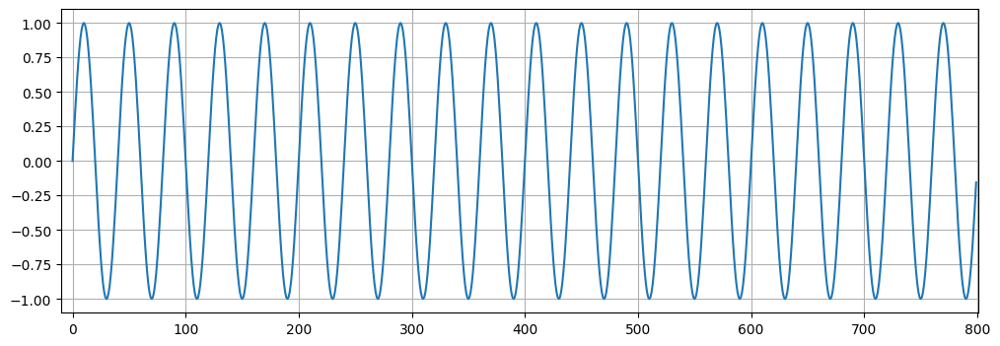

In [4]:
plt.figure(figsize=(12,4))
plt.xlim(-10, 801)
plt.grid(True)
plt.plot(x, y);

In [5]:
test_size = 40
train_set = y[:-test_size]
test_set = y[-test_size:]

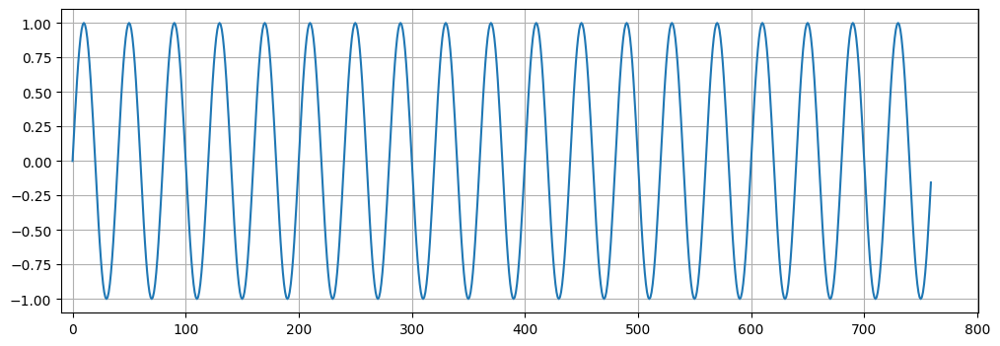

In [6]:
plt.figure(figsize=(12,4))
plt.xlim(-10, 801)
plt.grid(True)
plt.plot(train_set);

In [7]:
def input_data(seq, ws):
    out = [] # list of tuples: ([1,2,3,4], [4])
    for i in range(len(seq)-ws): # cannot go over the train data
        window = seq[i:i+ws]
        label = seq[i+ws:i+ws+1]
        out.append((window, label))

    return out

In [8]:
window_size = 40
train_data = input_data(train_set, window_size)
len(train_data), train_data[0][0].shape #len(train_data[0][0]), train_data[0][1]

(720, torch.Size([40]))

In [9]:
train_data[0][0]

tensor([ 0.0000e+00,  1.5643e-01,  3.0902e-01,  4.5399e-01,  5.8779e-01,
         7.0711e-01,  8.0902e-01,  8.9101e-01,  9.5106e-01,  9.8769e-01,
         1.0000e+00,  9.8769e-01,  9.5106e-01,  8.9100e-01,  8.0901e-01,
         7.0710e-01,  5.8778e-01,  4.5398e-01,  3.0901e-01,  1.5643e-01,
        -7.2400e-06, -1.5644e-01, -3.0902e-01, -4.5400e-01, -5.8779e-01,
        -7.0711e-01, -8.0902e-01, -8.9101e-01, -9.5106e-01, -9.8769e-01,
        -1.0000e+00, -9.8769e-01, -9.5105e-01, -8.9100e-01, -8.0901e-01,
        -7.0710e-01, -5.8777e-01, -4.5398e-01, -3.0900e-01, -1.5642e-01])

In [10]:
train_data[0][0].view(len(train_data[0][0]), 1, -1), train_data[0][0].view(len(train_data[0][0]), 1, -1).shape

(tensor([[[ 0.0000e+00]],
 
         [[ 1.5643e-01]],
 
         [[ 3.0902e-01]],
 
         [[ 4.5399e-01]],
 
         [[ 5.8779e-01]],
 
         [[ 7.0711e-01]],
 
         [[ 8.0902e-01]],
 
         [[ 8.9101e-01]],
 
         [[ 9.5106e-01]],
 
         [[ 9.8769e-01]],
 
         [[ 1.0000e+00]],
 
         [[ 9.8769e-01]],
 
         [[ 9.5106e-01]],
 
         [[ 8.9100e-01]],
 
         [[ 8.0901e-01]],
 
         [[ 7.0710e-01]],
 
         [[ 5.8778e-01]],
 
         [[ 4.5398e-01]],
 
         [[ 3.0901e-01]],
 
         [[ 1.5643e-01]],
 
         [[-7.2400e-06]],
 
         [[-1.5644e-01]],
 
         [[-3.0902e-01]],
 
         [[-4.5400e-01]],
 
         [[-5.8779e-01]],
 
         [[-7.0711e-01]],
 
         [[-8.0902e-01]],
 
         [[-8.9101e-01]],
 
         [[-9.5106e-01]],
 
         [[-9.8769e-01]],
 
         [[-1.0000e+00]],
 
         [[-9.8769e-01]],
 
         [[-9.5105e-01]],
 
         [[-8.9100e-01]],
 
         [[-8.0901e-01]],
 
         [[-7.0710e-

In [11]:
class LSTM(nn.Module):
    def __init__(self, input_size=1, hidden_size=50, output_size=1): # input_size: one feature in y, output: just 1 prediction, hidden_size: how many neurons inside LSTM, can playaround
        super().__init__()
        self.hidden_size = hidden_size
        self.lstm=nn.LSTM(input_size=input_size,
                          hidden_size=hidden_size)
        self.linear = nn.Linear(in_features=50, out_features=output_size)

        # (H, C)
        self.hidden = (torch.zeros(1,1,hidden_size), torch.zeros(1,1,hidden_size)) #(hidden state, cell state)

    def forward(self, x):
        lstm_out, self.hidden = self.lstm(x.view(len(x), 1, -1), self.hidden)

        pred =self.linear(lstm_out.view(len(x), -1))
        return pred[-1]
    

In [14]:
torch.manual_seed(42)
model = LSTM()
model

LSTM(
  (lstm): LSTM(1, 50)
  (linear): Linear(in_features=50, out_features=1, bias=True)
)

seq: tensor([ 0.0000e+00,  1.5643e-01,  3.0902e-01,  4.5399e-01,  5.8779e-01,
         7.0711e-01,  8.0902e-01,  8.9101e-01,  9.5106e-01,  9.8769e-01,
         1.0000e+00,  9.8769e-01,  9.5106e-01,  8.9100e-01,  8.0901e-01,
         7.0710e-01,  5.8778e-01,  4.5398e-01,  3.0901e-01,  1.5643e-01,
        -7.2400e-06, -1.5644e-01, -3.0902e-01, -4.5400e-01, -5.8779e-01,
        -7.0711e-01, -8.0902e-01, -8.9101e-01, -9.5106e-01, -9.8769e-01,
        -1.0000e+00, -9.8769e-01, -9.5105e-01, -8.9100e-01, -8.0901e-01,
        -7.0710e-01, -5.8777e-01, -4.5398e-01, -3.0900e-01, -1.5642e-01])
y_train: tensor([1.4480e-05])
y_pred: tensor([-0.1279], grad_fn=<SelectBackward0>)
seq: tensor([ 1.5643e-01,  3.0902e-01,  4.5399e-01,  5.8779e-01,  7.0711e-01,
         8.0902e-01,  8.9101e-01,  9.5106e-01,  9.8769e-01,  1.0000e+00,
         9.8769e-01,  9.5106e-01,  8.9100e-01,  8.0901e-01,  7.0710e-01,
         5.8778e-01,  4.5398e-01,  3.0901e-01,  1.5643e-01, -7.2400e-06,
        -1.5644e-01, -3.0902e-

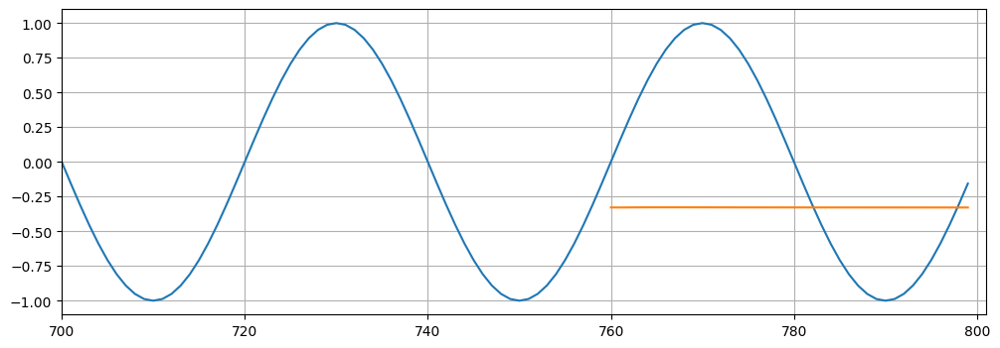

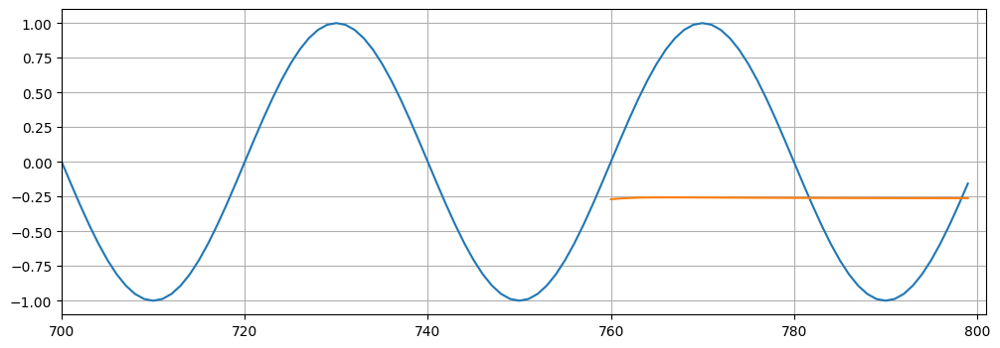

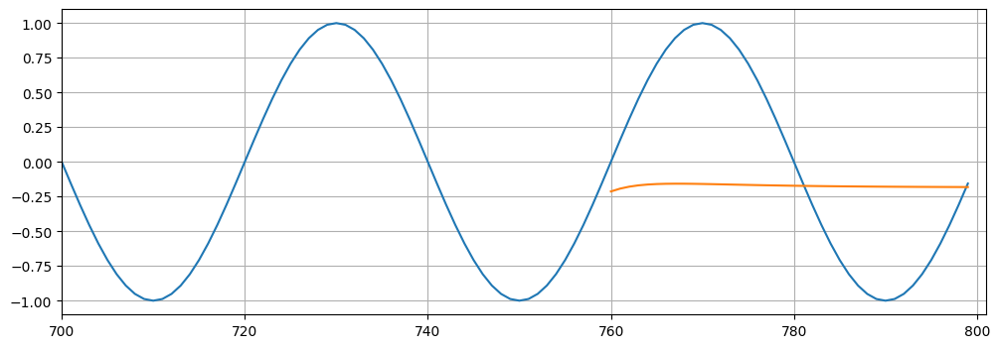

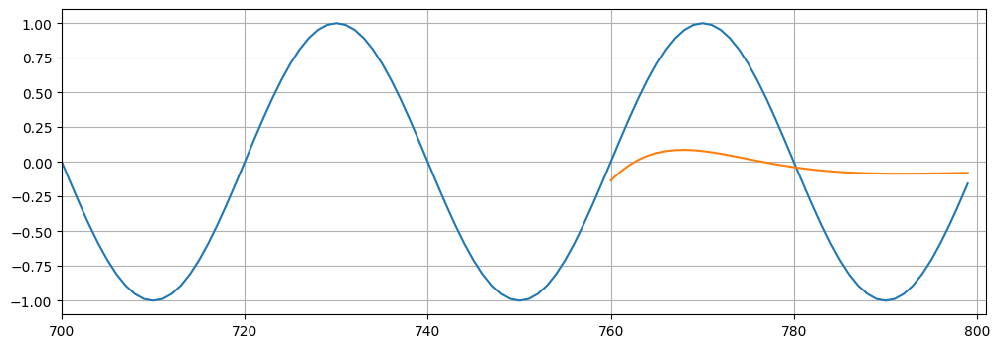

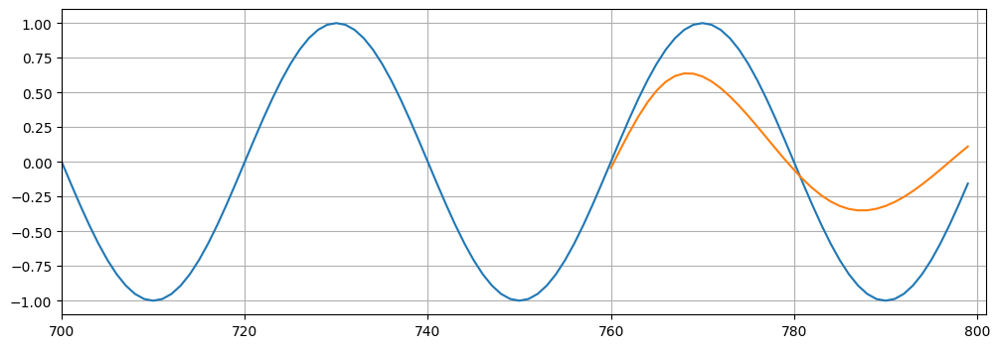

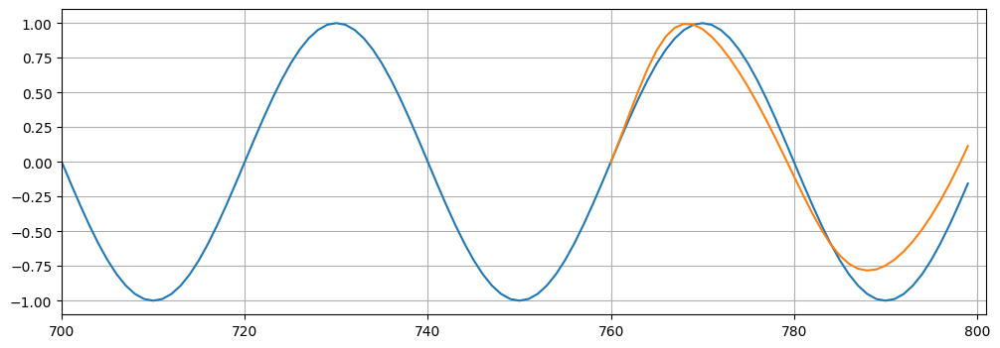

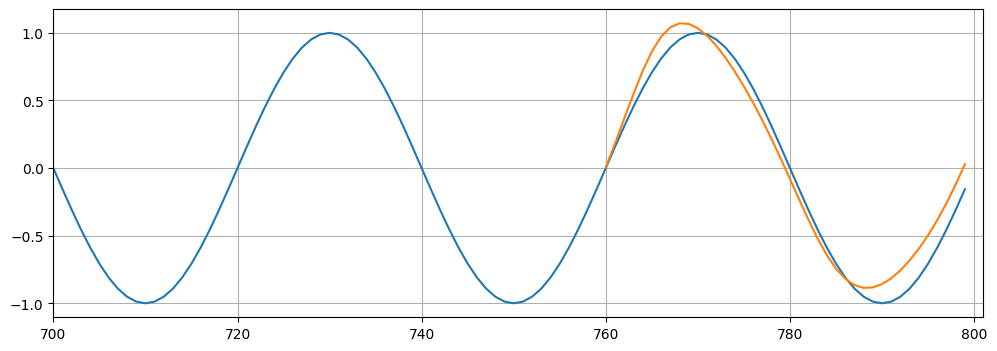

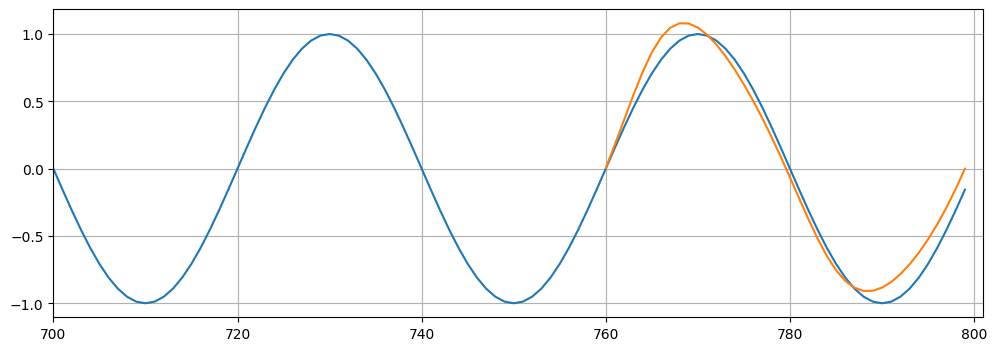

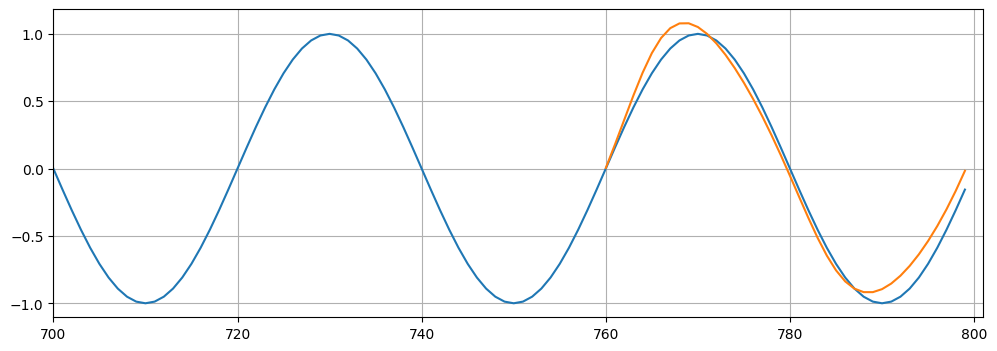

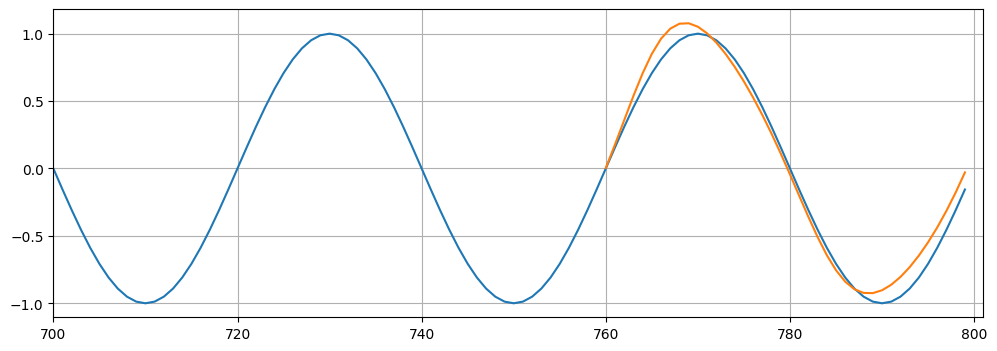

In [15]:
optimizer = torch.optim.SGD(model.parameters(), 0.01)
criterion = nn.MSELoss()

epochs = 10
future = 40

for i in range(epochs):
    for seq, y_train in train_data:
        print(f"seq: {seq}")
        print(f"y_train: {y_train}")
        optimizer.zero_grad()
        model.hidden = (torch.zeros(1, 1, model.hidden_size), torch.zeros(1,1, model.hidden_size))

        y_pred = model(seq)
        print(f"y_pred: {y_pred}")
        
        loss = criterion(y_pred, y_train)
        loss.backward()

        optimizer.step()

    print(f"Epoch {i}: {loss.item()}")

    preds = train_set[-window_size:].tolist()
    for p in range(future):
        seq = torch.FloatTensor(preds[-window_size:]) # because of the append below, this slicing will move a step further
        with torch.inference_mode():
            model.hidden = (torch.zeros(1, 1, model.hidden_size), torch.zeros(1,1, model.hidden_size))
            preds.append(model(seq).item())

    loss = criterion(torch.tensor(preds[-window_size:]), y[760:])

    print(f"performance on test range: {{loss}}")

    plt.figure(figsize=(12,4))
    plt.xlim(700, 801)
    plt.grid(True)
    plt.plot(y)
    plt.plot(range(760, 800), preds[-window_size:])
    

In [38]:
epochs = 15
window_size = 40
future = 40

all_data = input_data(y, window_size)
len(all_data)

760

seq: tensor([ 0.0000e+00,  1.5643e-01,  3.0902e-01,  4.5399e-01,  5.8779e-01,
         7.0711e-01,  8.0902e-01,  8.9101e-01,  9.5106e-01,  9.8769e-01,
         1.0000e+00,  9.8769e-01,  9.5106e-01,  8.9100e-01,  8.0901e-01,
         7.0710e-01,  5.8778e-01,  4.5398e-01,  3.0901e-01,  1.5643e-01,
        -7.2400e-06, -1.5644e-01, -3.0902e-01, -4.5400e-01, -5.8779e-01,
        -7.0711e-01, -8.0902e-01, -8.9101e-01, -9.5106e-01, -9.8769e-01,
        -1.0000e+00, -9.8769e-01, -9.5105e-01, -8.9100e-01, -8.0901e-01,
        -7.0710e-01, -5.8777e-01, -4.5398e-01, -3.0900e-01, -1.5642e-01])
y_train: tensor([1.4480e-05])
y_pred: tensor([0.0024], grad_fn=<SelectBackward0>)
seq: tensor([ 1.5643e-01,  3.0902e-01,  4.5399e-01,  5.8779e-01,  7.0711e-01,
         8.0902e-01,  8.9101e-01,  9.5106e-01,  9.8769e-01,  1.0000e+00,
         9.8769e-01,  9.5106e-01,  8.9100e-01,  8.0901e-01,  7.0710e-01,
         5.8778e-01,  4.5398e-01,  3.0901e-01,  1.5643e-01, -7.2400e-06,
        -1.5644e-01, -3.0902e-0

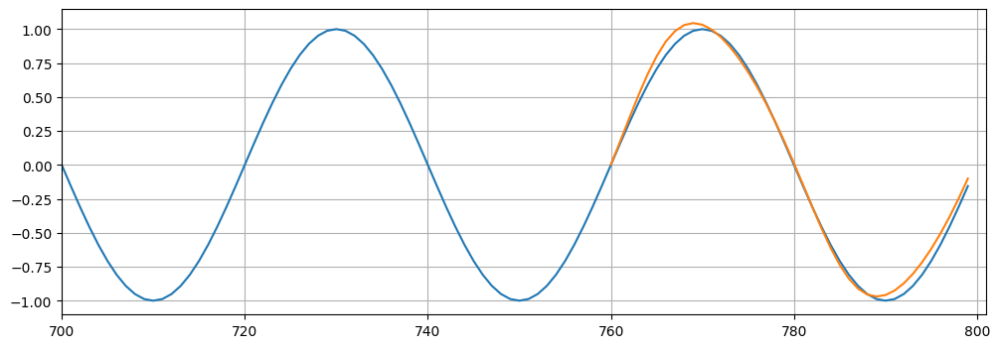

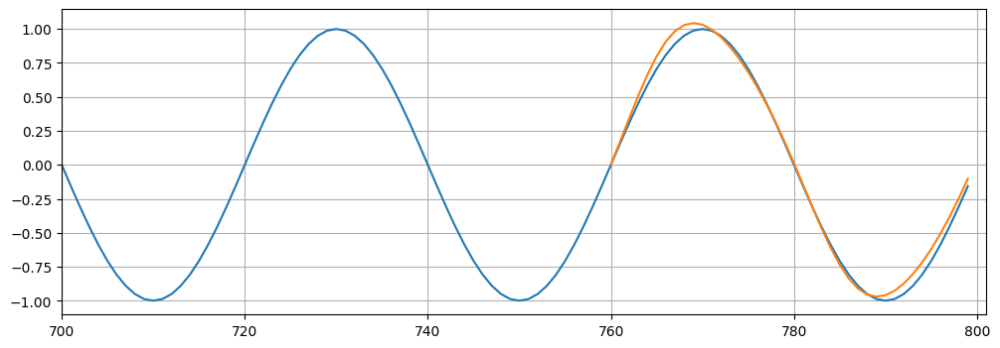

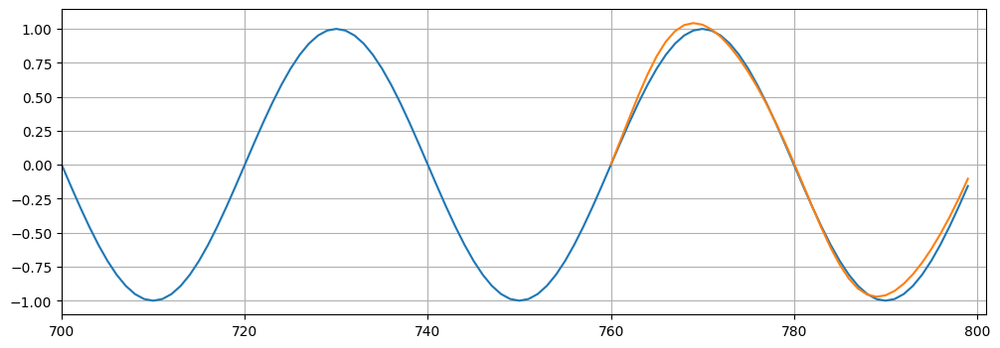

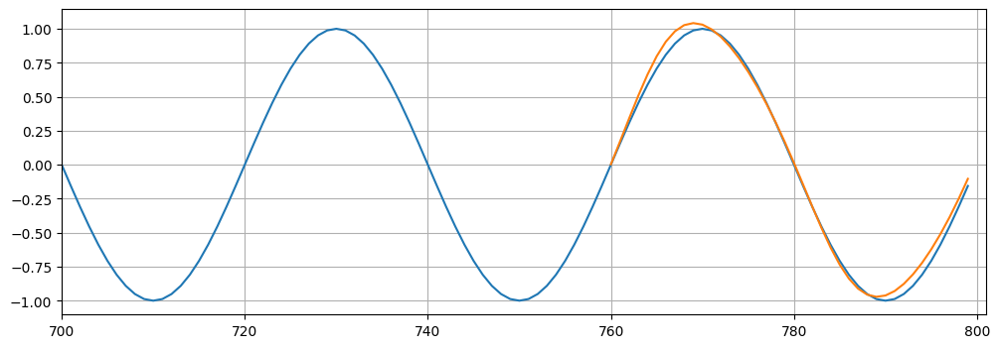

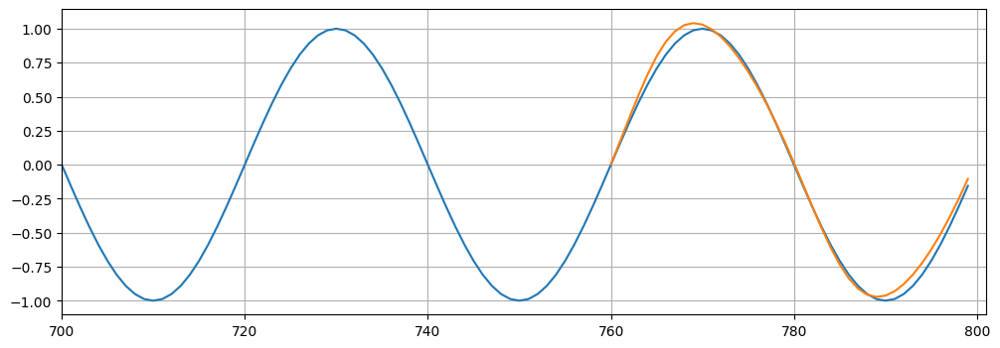

...

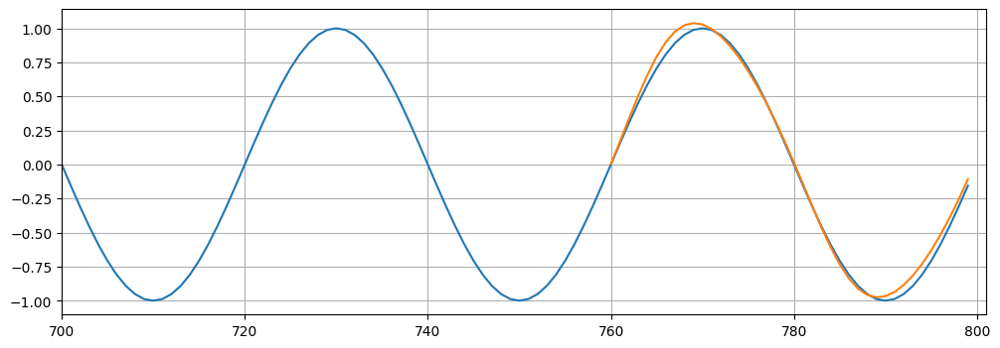

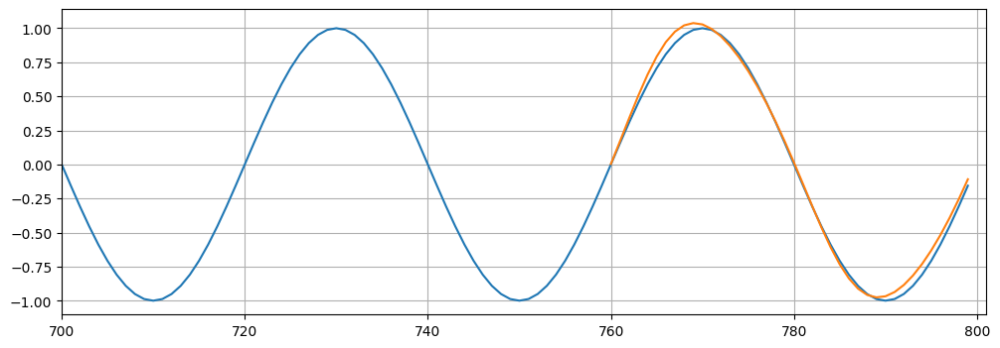

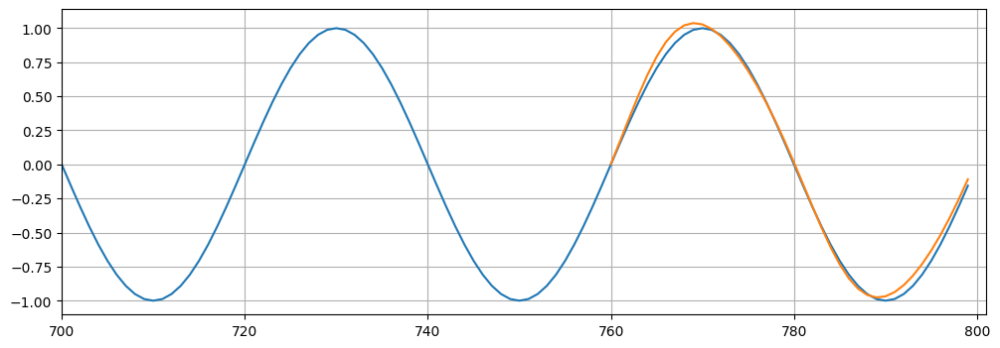

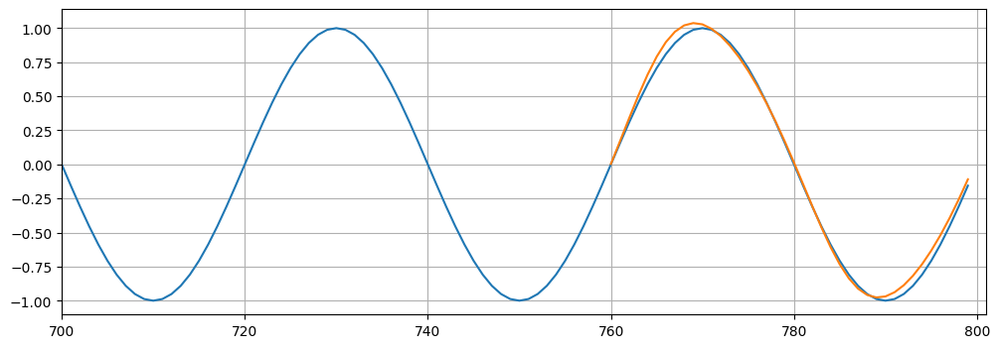

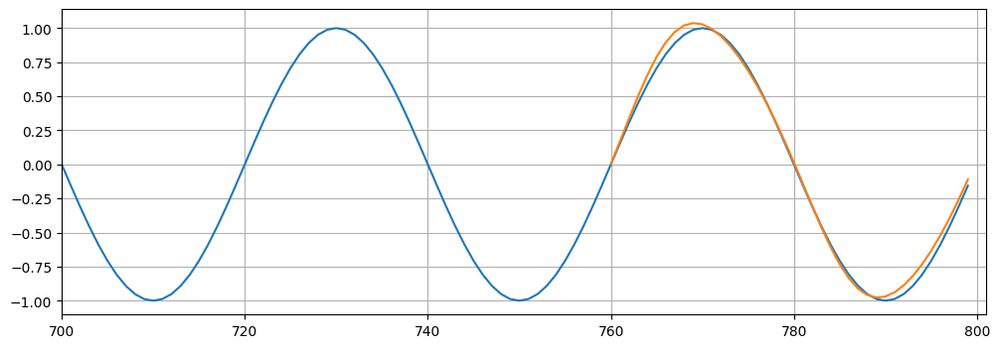

In [40]:
import time
start_time = time.time()

for i in range(epochs):
    for seq, y_train in all_data:
        print(f"seq: {seq}")
        print(f"y_train: {y_train}")
        optimizer.zero_grad()
        model.hidden = (torch.zeros(1, 1, model.hidden_size), torch.zeros(1,1, model.hidden_size))

        y_pred = model(seq)
        print(f"y_pred: {y_pred}")
        
        loss = criterion(y_pred, y_train)
        loss.backward()

        optimizer.step()

    print(f"Epoch {i}: {loss.item()}")

    preds = train_set[-window_size:].tolist()
    for f in range(future):
        seq = torch.FloatTensor(preds[-window_size:])
        with torch.inference_mode():
            model.hidden = (torch.zeros(1, 1, model.hidden_size), torch.zeros(1,1, model.hidden_size))
            preds.append(model(seq).item())

    loss = criterion(torch.tensor(preds[-window_size:]), y[760:])

    print(f"performance on test range: {{loss}}")

    plt.figure(figsize=(12,4))
    plt.xlim(700, 801)
    plt.grid(True)
    plt.plot(y)
    plt.plot(range(760, 800), preds[-window_size:])
    

total_time = time.time() - start_time
print(total_time/60)

In [41]:
# predict the future values

preds = y[-window_size:].tolist()

for i in range(future):
    seq=torch.FloatTensor(preds[-window_size:])
    with torch.inference_mode():
        model.hidden = (torch.zeros(1, 1, model.hidden_size), torch.zeros(1,1, model.hidden_size))
        preds.append(model(seq).item())

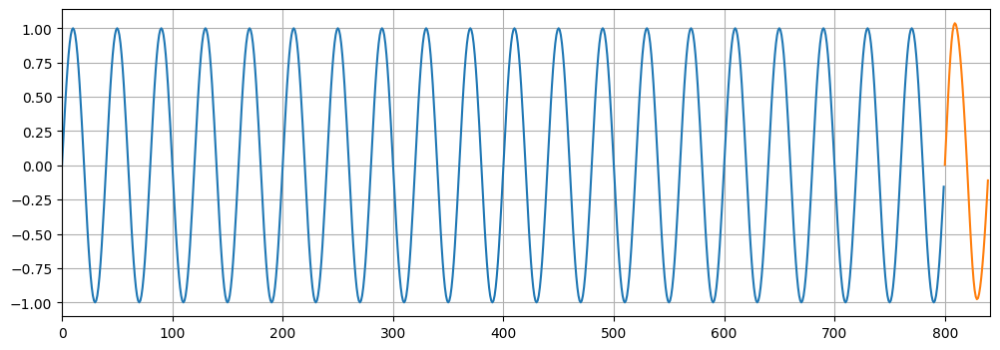

In [48]:

plt.figure(figsize=(12,4))
plt.xlim(0, 841)
plt.grid(True)
plt.plot(y)
plt.plot(range(800, 840), preds[window_size:])
    